<center>
    <h1>Máster en Business Analytics y Big Data (2019 - 2020)</h1>
    <h3><i>Trabajo de Fin de Máster</i></h3>
    <h2>"Predicción de ventas y detección de anomalías en tiempos de COVID-19 usando datos del mercado de valores y de la prensa internacional"</h2>
    <h3>Autor: Sergio Carrasco Sánchez</h3>
    <h3>Tutor: Juan Manuel Moreno Lamparero</h3>
</center>

<h2>Carga y limpieza de datos</h2>
<h3>Carga de datos de ventas</h3>

In [1]:
!pip install pandas

import pandas as pd

Cargamos datos de ventas desde archivo CSV.

In [2]:
sales_data_df = pd.read_csv('data/pedidos.csv')

In [3]:
sales_data_df

,id,fecha,usuario,forma_pago,total,subtotal,descuento,gastos_envio
0,1,2014-05-02 18:32:01,10614,transferencia,7.85,2.95,0.0,4.9
1,2,2014-05-02 19:01:55,10614,transferencia,8.19,3.29,0.0,4.9
2,3,2014-05-05 15:39:38,10615,contra-reembolso,10.65,5.75,0.0,4.9
3,7,2014-05-12 14:48:47,10619,transferencia,7.39,2.49,0.0,4.9
4,8,2014-05-12 14:52:46,10619,contra-reembolso,8.00,3.10,0.0,4.9
...,...,...,...,...,...,...,...,...
119375,128481,2020-10-31 21:16:04,68077,contra-reembolso,13.25,8.35,0.0,4.9
119376,128482,2020-10-31 21:30:12,68078,contra-reembolso,16.80,11.90,0.0,4.9
119377,128483,2020-10-31 22:00:58,41554,tarjeta,52.86,47.96,0.0,4.9
119378,128484,2020-10-31 22:13:14,64540,paypal,23.25,18.35,0.0,4.9


Eliminamos las columnas menos interesantes.

In [4]:
sales_data_df = sales_data_df.drop(['id', 'usuario', 'forma_pago', 'subtotal', 'descuento', 'gastos_envio'], axis=1)

In [5]:
sales_data_df = sales_data_df.rename({'fecha': 'date', 'total': 'sales'}, axis=1)

In [6]:
sales_data_df

,date,sales
0,2014-05-02 18:32:01,7.85
1,2014-05-02 19:01:55,8.19
2,2014-05-05 15:39:38,10.65
3,2014-05-12 14:48:47,7.39
4,2014-05-12 14:52:46,8.00
...,...,...
119375,2020-10-31 21:16:04,13.25
119376,2020-10-31 21:30:12,16.80
119377,2020-10-31 22:00:58,52.86
119378,2020-10-31 22:13:14,23.25


Agrupamos las ventas por día.

In [7]:
def daily_sales(data):
    data = data.copy()
    data.date = data.date.apply(lambda x: str(x)[:-9])
    data = data.groupby('date')['sales'].sum().reset_index()
    data.date = pd.to_datetime(data.date)
    
    return data

In [8]:
daily_sales_df = daily_sales(sales_data_df)

In [9]:
daily_sales_df

,date,sales
0,2014-05-02,16.04
1,2014-05-05,10.65
2,2014-05-12,53.54
3,2014-05-13,135.45
4,2014-05-15,144.89
...,...,...
2337,2020-10-27,4016.97
2338,2020-10-28,4641.49
2339,2020-10-29,3006.00
2340,2020-10-30,2181.25


In [10]:
daily_sales_df = daily_sales_df.set_index(daily_sales_df.date)

In [11]:
daily_sales_df = daily_sales_df.drop('date', axis=1)

In [12]:
daily_sales_df

,sales
date,
2014-05-02,16.04
2014-05-05,10.65
2014-05-12,53.54
2014-05-13,135.45
2014-05-15,144.89
...,...
2020-10-27,4016.97
2020-10-28,4641.49
2020-10-29,3006.00


<h3>Carga de datos del índice Nasdaq Composite</h3>

Importamos los datos del índice <strong>NASDAQ Composite</strong> del mismo periodo de tiempo de los datos de ventas.

In [13]:
!pip install yfinance

import yfinance as yf

In [14]:
min_date = min(daily_sales_df.index)
max_date = max(daily_sales_df.index)

In [15]:
min_date

Timestamp('2014-05-02 00:00:00')

In [16]:
max_date

Timestamp('2020-10-31 00:00:00')

In [17]:
ticker = '^IXIC'
ticker_name = 'NASDAQ Composite'

In [18]:
stock_data_df = yf.download(ticker, start=min_date, end=max_date)

[*********************100%***********************]  1 of 1 completed


In [19]:
stock_data_df.index.name = 'date'

In [20]:
stock_data_df

,Open,High,Low,Close,Adj Close,Volume
date,,,,,,
2014-05-02,4138.629883,4145.060059,4115.890137,4123.899902,4123.899902,1844790000
2014-05-05,4099.250000,4138.339844,4086.350098,4138.060059,4138.060059,1561170000
2014-05-06,4128.220215,4132.459961,4080.760010,4080.760010,4080.760010,1850610000
2014-05-07,4085.489990,4091.030029,4021.050049,4067.669922,4067.669922,2486030000
2014-05-08,4053.280029,4109.200195,4039.909912,4051.500000,4051.500000,2411940000
...,...,...,...,...,...,...
2020-10-26,11440.639648,11545.629883,11221.059570,11358.940430,11358.940430,3186950000
2020-10-27,11409.339844,11465.059570,11361.860352,11431.349609,11431.349609,3079530000
2020-10-28,11230.900391,11249.950195,10999.070312,11004.870117,11004.870117,3912580000


Unimos en un mismo dataframe los datos de ventas y los del índice.

In [21]:
daily_sales_df = pd.merge(left=daily_sales_df,
                          right=stock_data_df[{'Open',
                                               'High',
                                               'Low',
                                               'Close',
                                               'Adj Close',
                                               'Volume'}],
                          left_index=True,
                          right_index=True,
                          how='inner')

In [22]:
daily_sales_df = daily_sales_df.rename({'Open':'stock_open',
                                        'High':'stock_high',
                                        'Low':'stock_low',
                                        'Close':'stock_close',
                                        'Adj Close':'stock_adjclose',
                                        'Volume':'stock_volume'},
                                       axis=1)

In [23]:
daily_sales_df = daily_sales_df[['sales',
                                 'stock_open',
                                 'stock_high',
                                 'stock_low',
                                 'stock_close',
                                 'stock_adjclose',
                                 'stock_volume']]

In [24]:
daily_sales_df

,sales,stock_open,stock_high,stock_low,stock_close,stock_adjclose,stock_volume
date,,,,,,,
2014-05-02,16.04,4138.629883,4145.060059,4115.890137,4123.899902,4123.899902,1844790000
2014-05-05,10.65,4099.250000,4138.339844,4086.350098,4138.060059,4138.060059,1561170000
2014-05-12,53.54,4092.840088,4146.540039,4092.090088,4143.859863,4143.859863,1880020000
2014-05-13,135.45,4144.899902,4155.129883,4128.009766,4130.169922,4130.169922,1923480000
2014-05-15,144.89,4096.529785,4098.250000,4035.959961,4069.290039,4069.290039,2083030000
...,...,...,...,...,...,...,...
2020-10-26,4176.29,11440.639648,11545.629883,11221.059570,11358.940430,11358.940430,3186950000
2020-10-27,4016.97,11409.339844,11465.059570,11361.860352,11431.349609,11431.349609,3079530000
2020-10-28,4641.49,11230.900391,11249.950195,10999.070312,11004.870117,11004.870117,3912580000


<h3>Carga de datos del diario digital "The Economic Times"</h3>

In [25]:
!pip install requests
!pip install beautifulsoup4

import requests
from bs4 import BeautifulSoup
import time
import datetime
from dateutil import rrule
from calendar import monthrange
import csv

In [26]:
def read_url(year, month, starttime):
    url = f'https://economictimes.indiatimes.com/archivelist/year-{year},month-{month},starttime-{starttime}.cms'
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')
    
    return soup

In [27]:
def get_starttime(year, month, day):
    date1 = '1899-12-30'
    timestamp1 = time.mktime(datetime.datetime.strptime(date1, '%Y-%m-%d').timetuple())
    
    date2 = str(year) + '-' + str(month) + '-' + str(day)
    timestamp2 = time.mktime(datetime.datetime.strptime(date2, '%Y-%m-%d').timetuple())
    
    starttime = ((timestamp2 - timestamp1) / 86400)
    
    return str(starttime).replace(".0", "")

In [28]:
headlines_from = '2020-01-01'
headlines_to = '2020-10-31'

In [30]:
headlines_datetime_from = datetime.datetime.strptime(headlines_from, '%Y-%m-%d')
headlines_datetime_to = datetime.datetime.strptime(headlines_to, '%Y-%m-%d')

In [ ]:
for dt in rrule.rrule(rrule.MONTHLY, dtstart=headlines_datetime_from, until=headlines_datetime_to):
    year = int(dt.strftime('%Y'))
    month = int(dt.strftime('%m'))
    
    for day in range(1, (monthrange(year, month)[1] + 1)):
        starttime = get_starttime(year, month, day)
        date_str_eng = str(year) + '-' + '{:02d}'.format(month) + '-' + '{:02d}'.format(day)
        
        #print(f'Date: {year}-{month}-{day}')
        
        headlines = []

        soup = read_url(year, month, starttime)

        for td in soup.findAll('td', {'class':'contentbox5'}):
            for headline in td.findAll('a'):
                if 'archive' not in headline.get('href'):
                    if len(headline.contents) > 0:
                        if headline.contents[0] not in headlines:
                            headlines.append(headline.contents[0])

        time.sleep(1)

        file = open(f'data/economic_news_headlines_{date_str_eng}.csv', 'w')
        with file:
            write = csv.writer(file, escapechar='\\', quoting=csv.QUOTE_NONE)
            for item in headlines:
                write.writerow([item,])

Detectamos las palabras negativas encontradas en los titulares de noticias económicas.

In [31]:
!pip install stop-words

from stop_words import get_stop_words
import collections

In [32]:
stop_words = get_stop_words('en')

In [33]:
banned_chars = ['\\', '`', '"', '*', '_', '{', '}', '[', ']', '(', ')', '>', '#',
                '+', ':', '-', '.', ',', '¿', '?', '¡', '!', '$', '\'', '«', '»', '|']

In [34]:
negative_economic_words = ['coronavirus', 'sars-cov-2', 'covid-19', 'covid19', 'virus', 'pandemic',
                           'lockdown', 'outbreak', 'curfew', 'quarantine', 'crisis', 'fears', 'violence',
                           'death', 'cases', 'fall', 'hit', 'impact']

In [35]:
number_common_words = 20

In [36]:
negative_economic_words_df = pd.DataFrame(columns=['date', 'negative_economic_words'])

In [37]:
date_from = '2020-01-01'
date_to = '2020-10-31'

In [38]:
for date in pd.date_range(date_from, date_to, freq='d'):
    date_str_eng = date.strftime('%Y-%m-%d')
    
    print(f'Date: {date_str_eng}')
    print()
    
    file = open(f'data/economic_news_headlines_{date_str_eng}.csv', 'rt')

    headlines = []
    
    with file:
        csv_reader = csv.reader(file, escapechar='\\')

        for line in csv_reader:
            headlines.append(line)
    
    word_count = {}
    
    for headline in headlines:
        for word in headline[0].lower().split():
            for ch in banned_chars:
                if ch in word:
                    word = word.replace(ch, '')

            if (word != '') & (word not in stop_words):
                if word not in word_count:
                    word_count[word] = 1
                else:
                    word_count[word] += 1
    
    negative_words_count = 0
    word_counter = collections.Counter(word_count)
    
    print(f"Top {number_common_words} most common words:")
    print()
    
    for word, count in word_counter.most_common(number_common_words):
        print(f'{word}: {count}')

        if word in negative_economic_words:
            negative_words_count += count
    
    print()
    print(f"Negative words: {negative_words_count}")
    print()
    
    negative_economic_words_df = negative_economic_words_df.append({'date':date,
                                                                    'negative_economic_words':negative_words_count},
                                                                   ignore_index=True)

Date: 2020-01-01

Top 20 most common words:

market: 35
update: 29
rs: 26
share: 26
2020: 17
new: 16
year: 15
price: 15
bank: 13
target: 13
buy: 13
shares: 13
india: 12
1%: 12
stocks: 9
december: 9
trade: 9
power: 8
crore: 8
2019: 8

Negative words: 0

Date: 2020-01-02

Top 20 most common words:

rs: 40
market: 38
update: 35
share: 32
price: 20
bank: 17
target: 17
shares: 17
india: 16
buy: 16
stocks: 14
crore: 13
2020: 12
may: 11
index: 11
will: 10
says: 10
bse: 10
&: 10
1%: 10

Negative words: 0

Date: 2020-01-03

Top 20 most common words:

rs: 39
market: 37
update: 33
share: 32
india: 23
target: 20
price: 20
buy: 18
bank: 17
shares: 15
crore: 14
new: 13
2020: 12
2019: 11
stocks: 11
trade: 10
may: 10
power: 9
dips: 9
index: 9

Negative words: 0

Date: 2020-01-04

Top 20 most common words:

india: 11
new: 10
may: 6
will: 6
see: 5
can: 5
rs: 5
economy: 4
&: 4
review: 4
get: 4
attack: 4
govt: 4
indian: 4
2019: 4
us: 3
calls: 3
role: 3
board: 3
portfolio: 3

Negative words: 0

Date: 2020-

In [39]:
negative_economic_words_df

,date,negative_economic_words
0,2020-01-01,0
1,2020-01-02,0
2,2020-01-03,0
3,2020-01-04,0
4,2020-01-05,0
...,...,...
300,2020-10-27,12
301,2020-10-28,27
302,2020-10-29,0
303,2020-10-30,26


In [40]:
negative_economic_words_df.to_csv('data/negative_economic_words.csv', index=False)

Creamos una nube de palabras con todas las palabras negativas extraídas de los titulares de prensa.

In [41]:
headlines = []

In [42]:
for date in pd.date_range(date_from, date_to, freq='d'):
    date_str_eng = date.strftime('%Y-%m-%d')
    
    file = open(f'data/economic_news_headlines_{date_str_eng}.csv', 'rt')

    with file:
        csv_reader = csv.reader(file, escapechar='\\')

        for line in csv_reader:
            headlines.append(line)

In [43]:
word_count = {}
negative_word_count = {}

for headline in headlines:
    for word in headline[0].lower().split():
        for ch in banned_chars:
            if ch in word:
                word = word.replace(ch, '')
        
        if (word != '') & (word not in stop_words):
            if word not in word_count:
                word_count[word] = 1
            else:
                word_count[word] += 1
            
            if word in negative_economic_words:
                if word not in negative_word_count:
                    negative_word_count[word] = 1
                else:
                    negative_word_count[word] += 1

In [44]:
number_common_words = 25

word_counter = collections.Counter(word_count)
negative_word_counter = collections.Counter(negative_word_count)

most_common_words = {}
most_common_negative_words = {}

for word, count in word_counter.most_common(number_common_words):
    most_common_words[word] = count

for word, count in negative_word_counter.most_common(number_common_words):
    most_common_negative_words[word] = count
    print(f'{word}: {count}')

covid19: 5308
coronavirus: 3851
lockdown: 2061
cases: 1456
hit: 1200
pandemic: 1071
virus: 992
impact: 845
fall: 766
crisis: 605
death: 577
outbreak: 385
fears: 322
quarantine: 259
violence: 216
curfew: 76


In [45]:
!pip install wordcloud
!pip install matplotlib

from wordcloud import WordCloud
import matplotlib.pyplot as plt

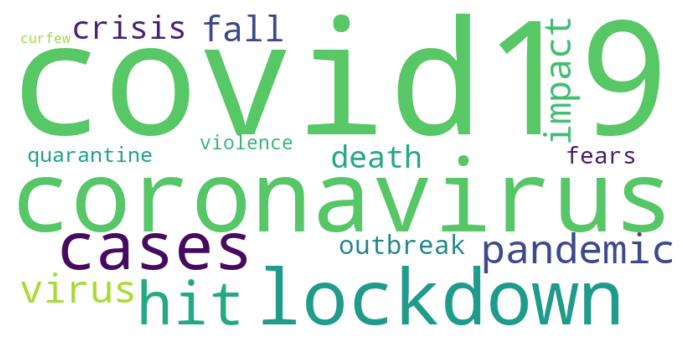

In [46]:
wc = WordCloud(background_color='white',
               max_font_size=256,
               random_state=42,
               width=800,
               height=400
              ).generate_from_frequencies(most_common_negative_words)
plt.figure(figsize=(12, 8))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

Creamos el dataframe "negative_economic_words_df" que contiene el número de palabras negativas de la prensa económica desde enero a octubre de 2020, y se unen estos datos al dataframe "daily_sales_df" que ya contenía los valores de las ventas y del índice Nasdaq Composite del mismo periodo de tiempo.

In [47]:
negative_economic_words_csv_df = pd.read_csv('data/negative_economic_words.csv')

In [48]:
negative_economic_words_csv_df = negative_economic_words_csv_df.set_index(negative_economic_words_csv_df.date)

In [49]:
negative_economic_words_csv_df = negative_economic_words_csv_df.drop('date', axis=1)

In [50]:
negative_economic_words_df = pd.DataFrame(columns=['date'])

In [51]:
for date in pd.date_range(min_date, max_date, freq='d'):
    negative_economic_words_df = negative_economic_words_df.append({'date':date}, ignore_index=True)

In [52]:
negative_economic_words_df = negative_economic_words_df.set_index(negative_economic_words_df.date)

In [53]:
negative_economic_words_df = negative_economic_words_df.drop('date', axis=1)

In [54]:
negative_economic_words_df = pd.merge(left=negative_economic_words_df,
                                      right=negative_economic_words_csv_df[{'negative_economic_words'}],
                                      left_index=True,
                                      right_index=True,
                                      how='outer')

In [55]:
negative_economic_words_df = negative_economic_words_df.fillna(0)

In [56]:
daily_sales_df = pd.merge(left=daily_sales_df,
                          right=negative_economic_words_df[{'negative_economic_words'}],
                          left_index=True,
                          right_index=True,
                          how='inner')

In [57]:
daily_sales_df

,sales,stock_open,stock_high,stock_low,stock_close,stock_adjclose,stock_volume,negative_economic_words
date,,,,,,,,
2014-05-02,16.04,4138.629883,4145.060059,4115.890137,4123.899902,4123.899902,1844790000,0.0
2014-05-05,10.65,4099.250000,4138.339844,4086.350098,4138.060059,4138.060059,1561170000,0.0
2014-05-12,53.54,4092.840088,4146.540039,4092.090088,4143.859863,4143.859863,1880020000,0.0
2014-05-13,135.45,4144.899902,4155.129883,4128.009766,4130.169922,4130.169922,1923480000,0.0
2014-05-15,144.89,4096.529785,4098.250000,4035.959961,4069.290039,4069.290039,2083030000,0.0
...,...,...,...,...,...,...,...,...
2020-10-26,4176.29,11440.639648,11545.629883,11221.059570,11358.940430,11358.940430,3186950000,15.0
2020-10-27,4016.97,11409.339844,11465.059570,11361.860352,11431.349609,11431.349609,3079530000,12.0
2020-10-28,4641.49,11230.900391,11249.950195,10999.070312,11004.870117,11004.870117,3912580000,27.0


Comprobamos el contraste entre los valores de las columnas "sales" y "negative_economic_words", principalmente a partir del día 13 de marzo.

In [58]:
daily_sales_df[(daily_sales_df.index >= '2020-03-01') & (daily_sales_df.index <= '2020-03-31')]

,sales,stock_open,stock_high,stock_low,stock_close,stock_adjclose,stock_volume,negative_economic_words
date,,,,,,,,
2020-03-02,3983.71,8667.139648,8952.809570,8543.349609,8952.169922,8952.169922,4232760000,44.0
2020-03-03,3447.97,8965.099609,9070.320312,8602.889648,8684.089844,8684.089844,4336700000,45.0
2020-03-04,4213.73,8834.099609,9019.959961,8757.660156,9018.089844,9018.089844,3602870000,60.0
2020-03-05,2616.82,8790.089844,8921.080078,8677.389648,8738.589844,8738.589844,3748090000,59.0
2020-03-06,1265.74,8469.019531,8612.360352,8375.129883,8575.620117,8575.620117,4279850000,40.0
2020-03-09,2952.63,7957.930176,8243.309570,7943.160156,7950.680176,7950.680176,4530350000,34.0
2020-03-10,3709.14,8219.759766,8347.400391,7930.430176,8344.250000,8344.250000,4431930000,30.0
2020-03-11,3652.05,8136.250000,8181.359863,7850.950195,7952.049805,7952.049805,4273890000,67.0
2020-03-12,1771.23,7398.580078,7712.330078,7194.669922,7201.799805,7201.799805,5066530000,119.0


<h3>Carga de datos del diario digital ABC.es</h3>

In [59]:
def read_url(date, page):
    url = f'https://www.abc.es/hemeroteca/dia-{date}/pagina-{page}'
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')
    html = soup.text
    contents = not("Sugerencias" in html)
    
    return contents, soup

In [60]:
headlines_from = '2020-05-21'
headlines_to = '2020-10-31'

In [62]:
headlines_timestamp_from = datetime.datetime.strptime(headlines_from, '%Y-%m-%d')
headlines_timestamp_to = datetime.datetime.strptime(headlines_to, '%Y-%m-%d')

In [ ]:
for date in pd.date_range(headlines_timestamp_from, headlines_timestamp_to, freq='d'):
    date_str_eng = date.strftime('%Y-%m-%d')
    date_str_spa = date.strftime('%d-%m-%Y')
    
    #print(f'Date: {date_str_eng}')
    #print()
    
    headlines = []
    page = 1
    
    contents, soup = read_url(date_str_spa, page)
    
    while contents:
        #print(f'Page: {page}')
        #print()
        for headline in soup.findAll('a', {'class':'titulo'}):
            #print(headline.contents[0])
            headlines.append(headline.contents[0])            
        time.sleep(1)
        page += 1
        contents, soup = read_url(date_str_spa, page)
        #print()
    
    file = open(f'data/news_headlines_{date_str_eng}.csv', 'w')
    
    with file:
        write = csv.writer(file, escapechar='\\', quoting=csv.QUOTE_NONE)
        for item in headlines:
            write.writerow([item,])

Se construyen las listas "stop_words" y "banned_chars" con las palabras (en español) y símbolos a evitar, y "negative_words" con las palabras negativas (en español) más comunes a contabilizar.

In [63]:
stop_words = get_stop_words('es')

In [64]:
banned_chars = ['\\', '`', '"', '*', '_', '{', '}', '[', ']', '(', ')', '>', '#',
                '+', ':', '-', '.', ',', '¿', '?', '¡', '!', '$', '\'', '«', '»', '|']

In [65]:
negative_words = ['coronavirus', 'sars-cov-2', 'covid-19', 'covid19', 'crisis', 'recesión', 'quiebra', 'caída',
                  'erte', 'ertes', 'cierre', 'cierra', 'ruina', 'alarma', 'medidas', 'casos', 'cuarentena', 'confinamiento',
                  'colapso', 'contagios', 'pandemia', 'epidemia', 'muertos', 'muertes', 'muere', 'fallecidos']

In [66]:
number_common_words = 25

In [67]:
negative_words_df = pd.DataFrame(columns=['date', 'negative_words'])

In [68]:
date_from = '2020-01-01'
date_to = '2020-10-31'

In [69]:
for date in pd.date_range(date_from, date_to, freq='d'):
    date_str_eng = date.strftime('%Y-%m-%d')
    
    print(f'Date: {date_str_eng}')
    print()
    
    file = open(f'data/news_headlines_{date_str_eng}.csv', 'rt')

    headlines = []
    
    with file:
        csv_reader = csv.reader(file, escapechar='\\')

        for line in csv_reader:
            headlines.append(line)
    
    word_count = {}
    
    for headline in headlines:
        for word in headline[0].lower().split():
            for ch in banned_chars:
                if ch in word:
                    word = word.replace(ch, '')

            if (word != '') & (word not in stop_words):
                if word not in word_count:
                    word_count[word] = 1
                else:
                    word_count[word] += 1
    
    negative_words_count = 0
    word_counter = collections.Counter(word_count)
    
    print(f"Top {number_common_words} most common words:")
    print()
    
    for word, count in word_counter.most_common(number_common_words):
        print(f'{word}: {count}')

        if word in negative_words:
            negative_words_count += count
    
    print()
    print(f"Negative words: {negative_words_count}")
    print()
    
    negative_words_df = negative_words_df.append({'date':date, 'negative_words':negative_words_count}, ignore_index=True)

Date: 2020-01-01

Top 25 most common words:

año: 25
2020: 24
nuevo: 15
tras: 10
madrid: 9
nochevieja: 8
campanadas: 8
valencia: 8
así: 7
dos: 7
2019: 7
enero: 6
sánchez: 6
deja: 6
españa: 6
años: 6
1: 5
puerta: 5
eeuu: 5
australia: 5
barcelona: 5
pedroche: 5
sorteo: 4
once: 4
da: 4

Negative words: 0

Date: 2020-01-02

Top 25 most common words:

año: 26
2020: 20
tras: 15
2019: 14
dos: 11
sánchez: 10
así: 9
enero: 8
años: 8
nuevo: 8
navidad: 8
madrid: 8
hoy: 7
jueves: 7
2: 7
muertos: 7
barcelona: 6
fin: 6
erc: 6
noticias: 6
prisión: 6
gobierno: 6
muere: 6
españa: 6
primer: 6

Negative words: 13

Date: 2020-01-03

Top 25 most common words:

2020: 20
sánchez: 17
reyes: 16
psoe: 15
españa: 14
torra: 13
años: 11
magos: 9
año: 9
menos: 9
investidura: 9
2019: 9
soleimani: 8
valencia: 8
enero: 8
erc: 8
tres: 8
general: 7
hoy: 7
3: 7
hombre: 7
muere: 7
tras: 7
acuerdo: 7
gobierno: 6

Negative words: 7

Date: 2020-01-04

Top 25 most common words:

sánchez: 64
investidura: 27
erc: 17
torra: 17
e

In [70]:
negative_words_df

,date,negative_words
0,2020-01-01,0
1,2020-01-02,13
2,2020-01-03,7
3,2020-01-04,0
4,2020-01-05,0
...,...,...
300,2020-10-27,51
301,2020-10-28,70
302,2020-10-29,91
303,2020-10-30,69


In [71]:
negative_words_df.to_csv('data/negative_words.csv', index=False)

Realizamos una nube de palabras con todas las palabras negativas extraídas de los titulares de prensa.

In [72]:
headlines = []

In [73]:
for date in pd.date_range(date_from, date_to, freq='d'):
    date_str_eng = date.strftime('%Y-%m-%d')
    
    file = open(f'data/news_headlines_{date_str_eng}.csv', 'rt')

    with file:
        csv_reader = csv.reader(file, escapechar='\\')

        for line in csv_reader:
            headlines.append(line)

In [74]:
word_count = {}
negative_word_count = {}

for headline in headlines:
    for word in headline[0].lower().split():
        for ch in banned_chars:
            if ch in word:
                word = word.replace(ch, '')

        if (word != '') & (word not in stop_words):
            if word not in word_count:
                word_count[word] = 1
            else:
                word_count[word] += 1
            
            if word in negative_words:
                if word not in negative_word_count:
                    negative_word_count[word] = 1
                else:
                    negative_word_count[word] += 1

In [75]:
number_common_words = 25

word_counter = collections.Counter(word_count)
negative_word_counter = collections.Counter(negative_word_count)

most_common_words = {}
most_common_negative_words = {}

for word, count in word_counter.most_common(number_common_words):
    most_common_words[word] = count

for word, count in negative_word_counter.most_common(number_common_words):
    most_common_negative_words[word] = count
    print(f'{word}: {count}')

coronavirus: 10362
covid19: 3121
casos: 1674
confinamiento: 1573
pandemia: 1511
alarma: 1346
crisis: 1324
muere: 1176
medidas: 1162
contagios: 1077
muertos: 933
fallecidos: 928
cuarentena: 752
cierre: 511
muertes: 462
cierra: 461
erte: 428
caída: 271
epidemia: 163
colapso: 101
ertes: 64
recesión: 47
ruina: 39
quiebra: 32


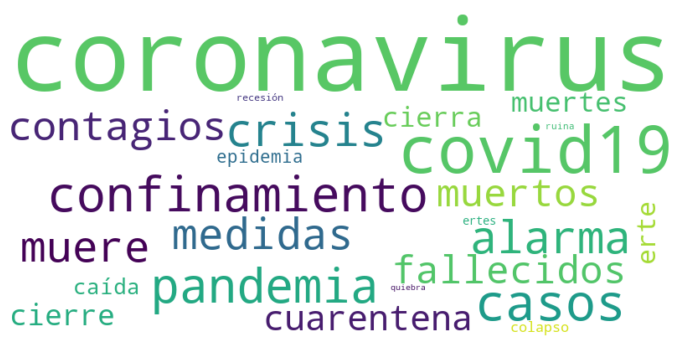

In [76]:
wc = WordCloud(background_color='white',
               max_font_size=256,
               random_state=42,
               width=800,
               height=400
              ).generate_from_frequencies(most_common_negative_words)
plt.figure(figsize=(12, 8))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

Por último, se crea el dataframe "negative_words_df" que contiene el número de palabras negativas de la prensa generalista desde enero a octubre de 2020, y se unen estos datos al dataframe "daily_sales_df" que ya contenía los valores de las ventas, del índice Nasdaq Composite y el número de palabras negativas de la prensa económica del mismo periodo de tiempo.

In [77]:
negative_words_csv_df = pd.read_csv('data/negative_words.csv')

In [78]:
negative_words_csv_df = negative_words_csv_df.set_index(negative_words_csv_df.date)

In [79]:
negative_words_csv_df = negative_words_csv_df.drop('date', axis=1)

In [80]:
negative_words_df = pd.DataFrame(columns=['date'])

In [81]:
for date in pd.date_range(min_date, max_date, freq='d'):
    negative_words_df = negative_words_df.append({'date':date}, ignore_index=True)

In [82]:
negative_words_df = negative_words_df.set_index(negative_words_df.date)

In [83]:
negative_words_df = negative_words_df.drop('date', axis=1)

In [84]:
negative_words_df = pd.merge(left=negative_words_df,
                             right=negative_words_csv_df[{'negative_words'}],
                             left_index=True,
                             right_index=True, how='outer')

In [85]:
negative_words_df = negative_words_df.fillna(0)

In [86]:
daily_sales_df = pd.merge(left=daily_sales_df,
                          right=negative_words_df[{'negative_words'}],
                          left_index=True,
                          right_index=True,
                          how='inner')

Comprobamos el contraste entre los valores de las columnas “sales” y “negative_words”, principalmente a partir del día 12 de marzo.

In [87]:
daily_sales_df[(daily_sales_df.index >= '2020-03-01') & (daily_sales_df.index <= '2020-03-31')]

,sales,stock_open,stock_high,stock_low,stock_close,stock_adjclose,stock_volume,negative_economic_words,negative_words
date,,,,,,,,,
2020-03-02,3983.71,8667.139648,8952.809570,8543.349609,8952.169922,8952.169922,4232760000,44.0,56.0
2020-03-03,3447.97,8965.099609,9070.320312,8602.889648,8684.089844,8684.089844,4336700000,45.0,30.0
2020-03-04,4213.73,8834.099609,9019.959961,8757.660156,9018.089844,9018.089844,3602870000,60.0,81.0
2020-03-05,2616.82,8790.089844,8921.080078,8677.389648,8738.589844,8738.589844,3748090000,59.0,89.0
2020-03-06,1265.74,8469.019531,8612.360352,8375.129883,8575.620117,8575.620117,4279850000,40.0,99.0
2020-03-09,2952.63,7957.930176,8243.309570,7943.160156,7950.680176,7950.680176,4530350000,34.0,57.0
2020-03-10,3709.14,8219.759766,8347.400391,7930.430176,8344.250000,8344.250000,4431930000,30.0,99.0
2020-03-11,3652.05,8136.250000,8181.359863,7850.950195,7952.049805,7952.049805,4273890000,67.0,70.0
2020-03-12,1771.23,7398.580078,7712.330078,7194.669922,7201.799805,7201.799805,5066530000,119.0,148.0


<h2>Análisis exploratorio de datos</h2>

In [88]:
daily_sales_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1619 entries, 2014-05-02 to 2020-10-30
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   sales                    1619 non-null   float64
 1   stock_open               1619 non-null   float64
 2   stock_high               1619 non-null   float64
 3   stock_low                1619 non-null   float64
 4   stock_close              1619 non-null   float64
 5   stock_adjclose           1619 non-null   float64
 6   stock_volume             1619 non-null   int64  
 7   negative_economic_words  1619 non-null   float64
 8   negative_words           1619 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 126.5 KB


In [89]:
daily_sales_df.describe()

,sales,stock_open,stock_high,stock_low,stock_close,stock_adjclose,stock_volume,negative_economic_words,negative_words
count,1619.000000,1619.000000,1619.000000,1619.000000,1619.000000,1619.000000,1.619000e+03,1619.000000,1619.000000
mean,2155.181736,6592.354824,6631.910521,6549.335996,6593.941003,6593.941003,2.229360e+09,4.693020,9.328598
std,1275.947503,1812.351924,1828.838675,1792.947666,1812.019860,1812.019860,7.790421e+08,19.611688,33.645531
min,10.650000,4070.350098,4091.159912,4035.959961,4069.290039,4069.290039,1.494100e+08,0.000000,0.000000
25%,1155.110000,4986.854980,5006.074951,4960.900146,4987.380127,4987.380127,1.792840e+09,0.000000,0.000000
50%,1930.130000,6350.790039,6375.750000,6324.750000,6352.330078,6352.330078,1.999330e+09,0.000000,0.000000
75%,2983.415000,7823.969971,7862.010010,7777.604980,7824.609863,7824.609863,2.317350e+09,0.000000,0.000000
max,7042.600000,12047.259766,12074.059570,11836.179688,12056.440430,12056.440430,7.279230e+09,194.000000,396.000000


Mediante la observación de los histogramas ya se aprecia una fuerte correlación entre las variables "stock_open", "stock_high", "stock_low", "stock_close" y "stock_adjclose", así como entre las variables "negative_economic_words" y "negative_words".

array([[<AxesSubplot:title={'center':'sales'}>,
        <AxesSubplot:title={'center':'stock_open'}>,
        <AxesSubplot:title={'center':'stock_high'}>],
       [<AxesSubplot:title={'center':'stock_low'}>,
        <AxesSubplot:title={'center':'stock_close'}>,
        <AxesSubplot:title={'center':'stock_adjclose'}>],
       [<AxesSubplot:title={'center':'stock_volume'}>,
        <AxesSubplot:title={'center':'negative_economic_words'}>,
        <AxesSubplot:title={'center':'negative_words'}>]], dtype=object)

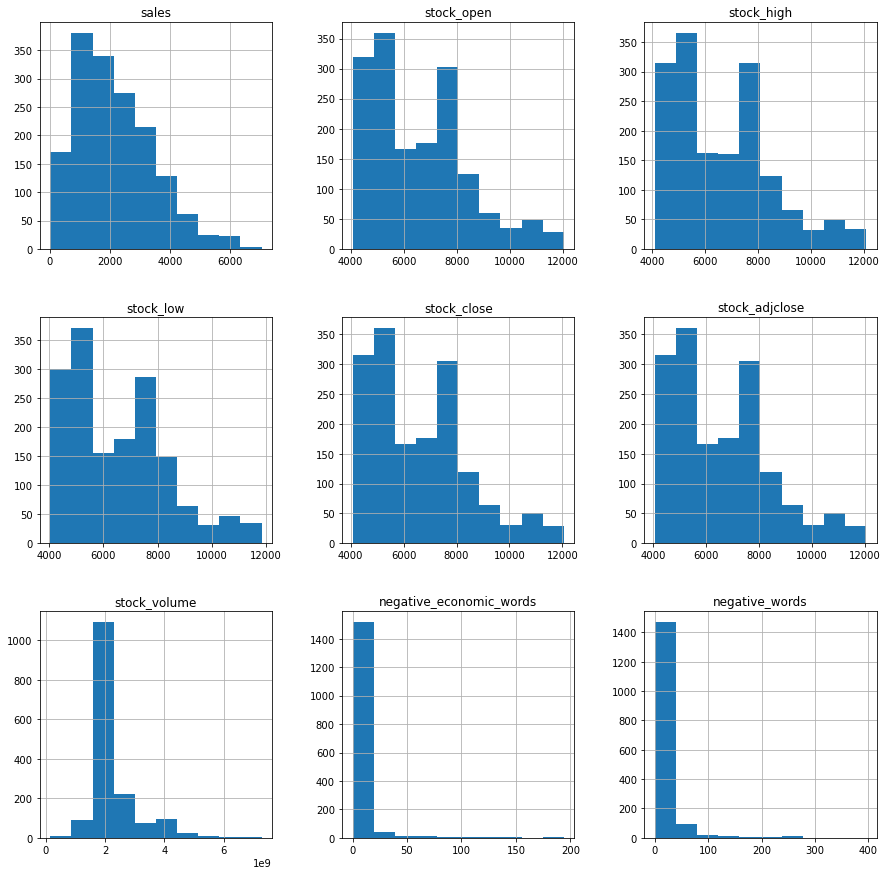

In [90]:
daily_sales_df.hist(figsize=(15, 15))

Se procede a realizar algunas comprobaciones adicionales sobre los datos.

In [91]:
!pip install pandas-profiling

from pandas_profiling import ProfileReport

In [92]:
profile = ProfileReport(daily_sales_df, title="Pandas Profiling Report")

In [93]:
profile

A continuación, se profundiza en el estudio de la correlación entre variables mediante la creación de un mapa de calor.

In [94]:
!pip install seaborn

import seaborn as sns

Comprobamos la posible correlación entre variables mediante un mapa de calor, para lo cual utilizamos el método corr de Pandas.

In [95]:
corr = daily_sales_df.corr()

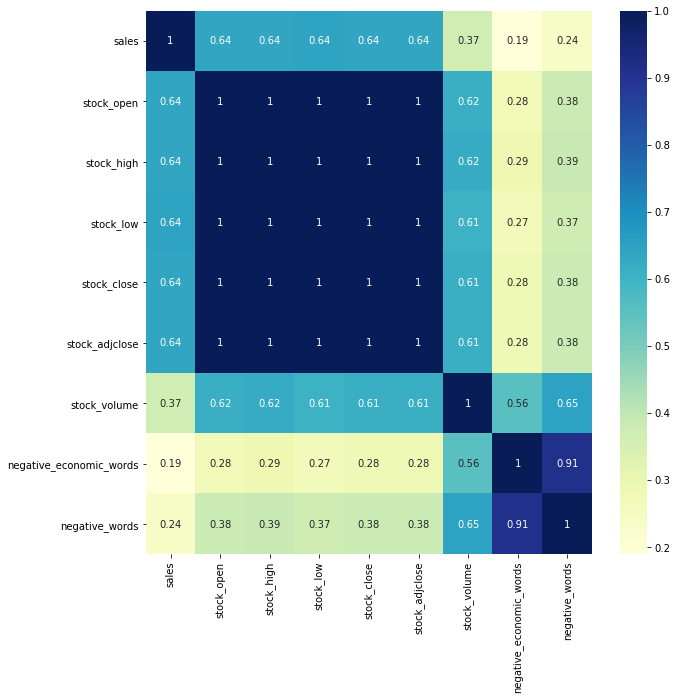

In [96]:
plt.subplots(figsize=(10, 10))
sns.heatmap(corr, annot=True, cmap='YlGnBu')
plt.show()

Como podemos observar, el mapa de calor de correlación nos proporciona una descripción visual de la relación entre las variables. Ahora bien, no queremos un conjunto de variables independientes que tenga una relación más o menos similar con las variables dependientes. Si nos fijamos en la variable dependiente “sales” nos cercioramos que no existe fuerte correlación con ninguna variable independiente.

No obstante, se tratará de eliminar la fuerte dependencia entre las variables independientes "stock_open", "stock_high", "stock_low", "stock_close" y "stock_adjclose" añadiendo una nueva variable llamada "stock_mean" como media de las variables "stock_high" y "stock_low", y se comprueba de nuevo la correlación resultante.

In [97]:
daily_sales_df['stock_mean'] = (daily_sales_df.stock_low + daily_sales_df.stock_high) / 2

In [98]:
daily_sales_df = daily_sales_df[['sales', 'stock_volume', 'stock_mean', 'negative_words', 'negative_economic_words']]

In [99]:
corr = daily_sales_df.corr()

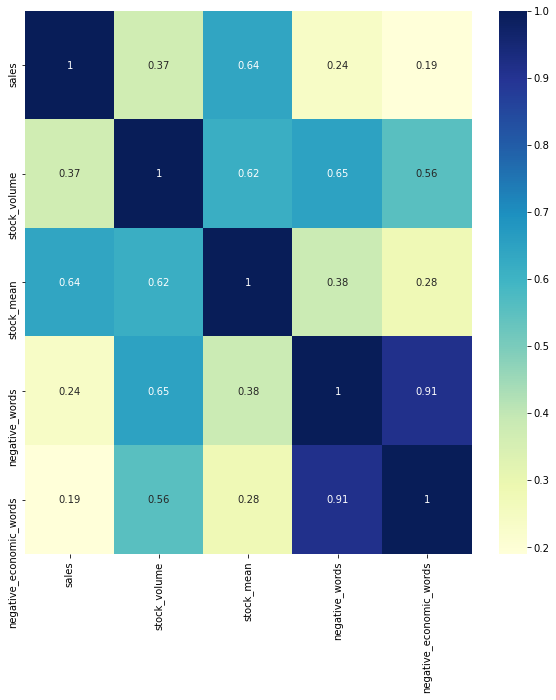

In [100]:
plt.subplots(figsize=(10, 10))
sns.heatmap(corr, annot=True, cmap='YlGnBu')
plt.show()

Aunque se sigue observando una fuerte correlación entre las variables "negative_words" y "negative_economic_words" se mantendrán para la aplicación del modelo predictivo.

Observamos en una gráfica el comportamiento de las ventas diarias.

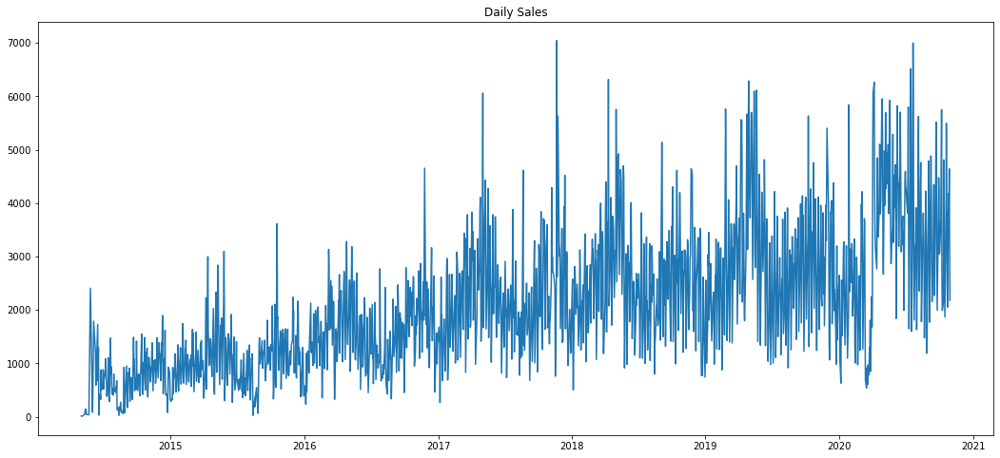

In [101]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title('Daily Sales')
plt.plot(daily_sales_df.index, daily_sales_df.sales)
plt.show()

Observamos el comportamiento de los valores del índice NASDAQ.

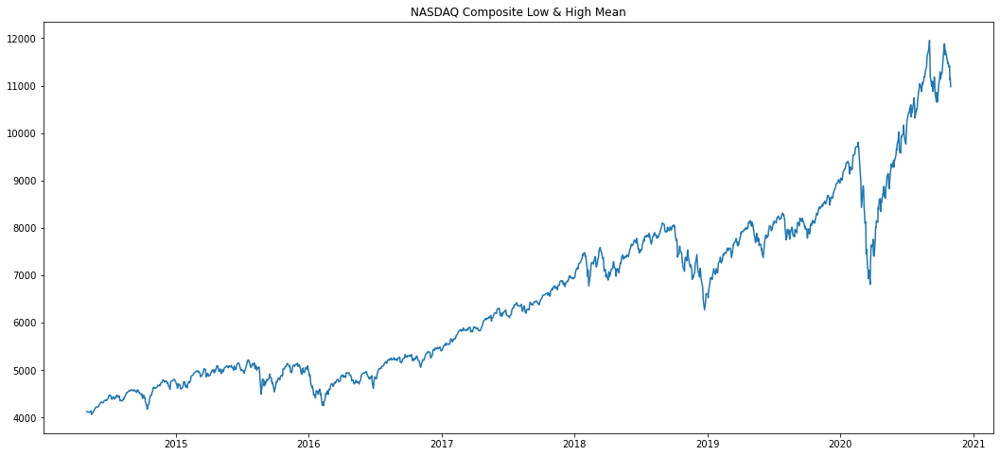

In [102]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title(f'{ticker_name} Low & High Mean')
plt.plot(daily_sales_df.index, daily_sales_df.stock_mean)
plt.show()

Comprobamos que tiene un comportamiento ciertamente similar al de las ventas.

Comprobamos que a mediados de marzo de 2020 se produce un fuerte descenso de las ventas, y un fuerte aumento un mes después, con un crecimiento sostenido en el futuro respecto a periodos anteriores.

A continuación, se observan los mismos valores en un periodo de tiempo que contiene el momento inicial de la pandemia (entre enero y mayo de 2020), comprobando que tienen un comportamiento ciertamente similar.

In [103]:
pandemic_period_date_from = '2020-01-01'
pandemic_period_date_to = '2020-05-31'

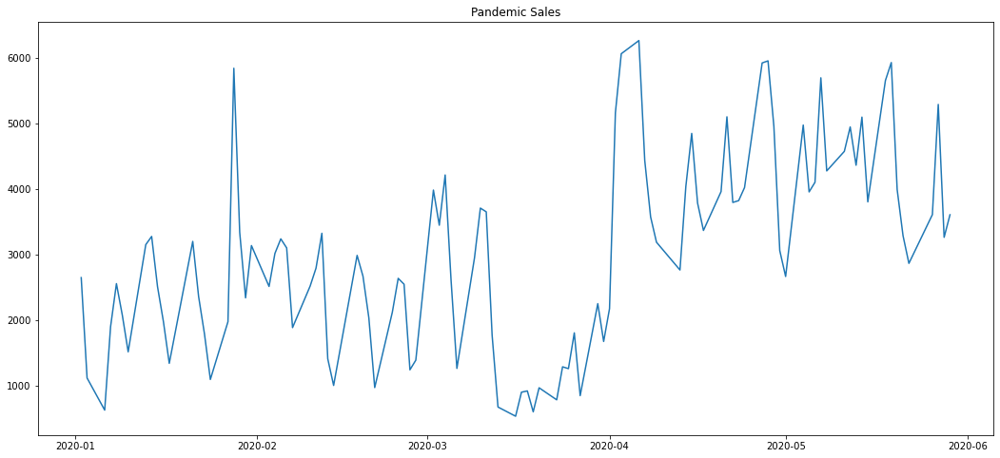

In [104]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title('Pandemic Sales')
plt.plot(daily_sales_df.index[(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)], daily_sales_df['sales'][(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)])
plt.show()

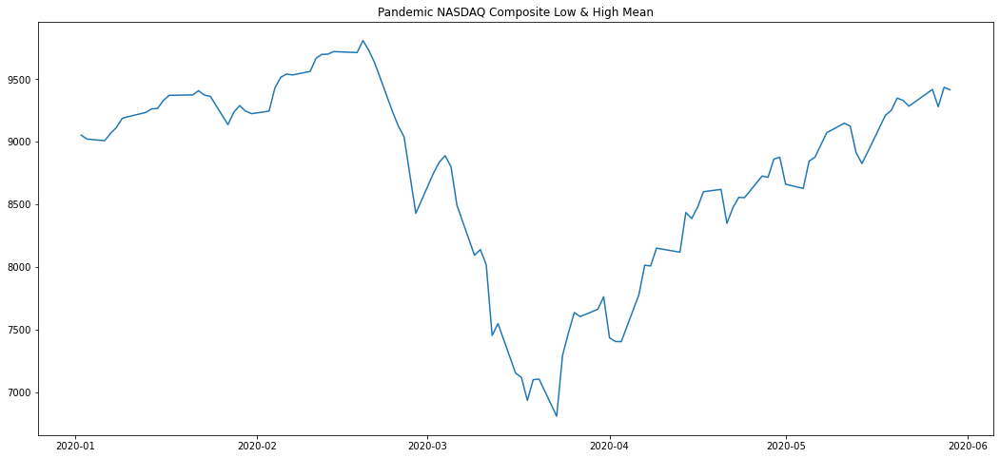

In [105]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title(f'Pandemic {ticker_name} Low & High Mean')
plt.plot(daily_sales_df.index[(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)], daily_sales_df.stock_mean[(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)])
plt.show()

Por último, se observa la gráfica de los valores de las palabras negativas, comprobando que tiene un comportamiento inverso al de las ventas y del índice Nasdaq Composite.

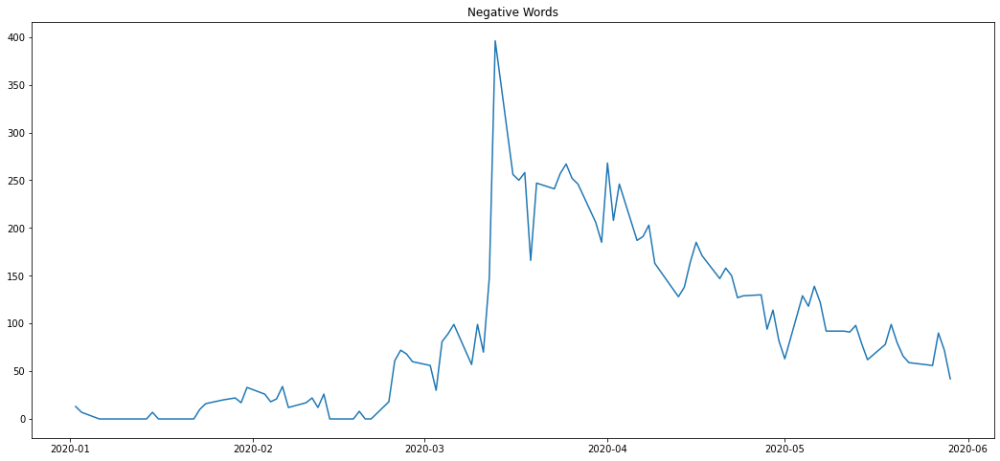

In [106]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title('Negative Words')
plt.plot(daily_sales_df.index[(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)], daily_sales_df['negative_words'][(daily_sales_df.index >= pandemic_period_date_from) & (daily_sales_df.index <= pandemic_period_date_to)])
plt.show()

<h2>Modelo de predicción</h2>

Se procede a la preparación de los conjuntos de datos de entrenamiento y de prueba con las variables independientes (exógenas) y dependientes (endógenas) para nuestro modelo predictivo de series temporales SARIMAX.

In [107]:
daily_sales_df = daily_sales_df.reset_index()

In [108]:
daily_sales_df

,date,sales,stock_volume,stock_mean,negative_words,negative_economic_words
0,2014-05-02,16.04,1844790000,4130.475098,0.0,0.0
1,2014-05-05,10.65,1561170000,4112.344971,0.0,0.0
2,2014-05-12,53.54,1880020000,4119.315063,0.0,0.0
3,2014-05-13,135.45,1923480000,4141.569824,0.0,0.0
4,2014-05-15,144.89,2083030000,4067.104980,0.0,0.0
...,...,...,...,...,...,...
1614,2020-10-26,4176.29,3186950000,11383.344727,43.0,15.0
1615,2020-10-27,4016.97,3079530000,11413.459961,51.0,12.0
1616,2020-10-28,4641.49,3912580000,11124.510254,70.0,27.0
1617,2020-10-29,3006.00,3222460000,11158.910156,91.0,0.0


Preparamos el dataset <strong>X</strong> con las variables independientes (exógenas).

In [109]:
X = daily_sales_df[['date', 'stock_volume', 'stock_mean', 'negative_words', 'negative_economic_words']]

In [110]:
X

,date,stock_volume,stock_mean,negative_words,negative_economic_words
0,2014-05-02,1844790000,4130.475098,0.0,0.0
1,2014-05-05,1561170000,4112.344971,0.0,0.0
2,2014-05-12,1880020000,4119.315063,0.0,0.0
3,2014-05-13,1923480000,4141.569824,0.0,0.0
4,2014-05-15,2083030000,4067.104980,0.0,0.0
...,...,...,...,...,...
1614,2020-10-26,3186950000,11383.344727,43.0,15.0
1615,2020-10-27,3079530000,11413.459961,51.0,12.0
1616,2020-10-28,3912580000,11124.510254,70.0,27.0
1617,2020-10-29,3222460000,11158.910156,91.0,0.0


Preparamos el dataset <strong>y</strong> con la variable dependiente (endógena).

In [111]:
y = daily_sales_df[['date', 'sales']]

In [112]:
y

,date,sales
0,2014-05-02,16.04
1,2014-05-05,10.65
2,2014-05-12,53.54
3,2014-05-13,135.45
4,2014-05-15,144.89
...,...,...
1614,2020-10-26,4176.29
1615,2020-10-27,4016.97
1616,2020-10-28,4641.49
1617,2020-10-29,3006.00


Preparamos los dataset <strong>train_sales_vals</strong> y <strong>train_exog_vals</strong> con los conjuntos de datos de entrenamiento desde el periodo 01/01/2016 a 31/12/2019. Desestimamos las ventas anteriores a 01/01/2016 al presentar valores de ventas irregulares (fueron los años de arranque del negocio).

In [113]:
train_date_from = '2016-01-01'
train_date_to = '2019-12-31'

In [114]:
train_size = int(len(X[(X.date >= train_date_from) & (X.date <= train_date_to)]))

In [115]:
train_size

1006

In [116]:
train_sales_vals = y.sales[(y.date >= train_date_from) & (y.date <= train_date_to)]
train_sales_vals = train_sales_vals.reset_index(drop=True)

In [117]:
train_exog_vals = X[(X.date >= train_date_from) & (X.date <= train_date_to)][['stock_volume', 'stock_mean', 'negative_words', 'negative_economic_words']]
train_exog_vals = train_exog_vals.reset_index(drop=True)

Preparamos los dataset <strong>test_sales_vals</strong> y <strong>test_exog_vals</strong> con los conjuntos de datos de test desde el periodo 01/01/2020 a 30/10/2020.

In [118]:
test_date_from = '2020-01-01'
test_date_to = '2020-10-30'

In [119]:
test_size = int(len(y[(y.date >= test_date_from) & (y.date <= test_date_to)]))

In [120]:
test_size

211

In [121]:
test_sales_vals = y.sales[(y.date >= test_date_from) & (y.date <= test_date_to)]
test_sales_vals = test_sales_vals.reset_index(drop=True)

In [122]:
test_exog_vals = X[(X.date >= test_date_from) & (X.date <= test_date_to)][['stock_volume', 'stock_mean', 'negative_words', 'negative_economic_words']]
test_exog_vals = test_exog_vals.reset_index(drop=True)

A continuación, se procede a trabajar en el problema de predicción. Es importante recordar que, al tratarse de un problema de predicción de series temporales, es necesario probar la estacionalidad de la serie temporales para poder aplicar el modelo SARIMAX.

Se parte de la observación de la estacionalidad de los valores de las ventas en el periodo de un año.

In [123]:
!pip install pip install statsmodels

import statsmodels.api as sm

In [124]:
seas_d = sm.tsa.seasonal_decompose(y['sales'], model='add', period=365)

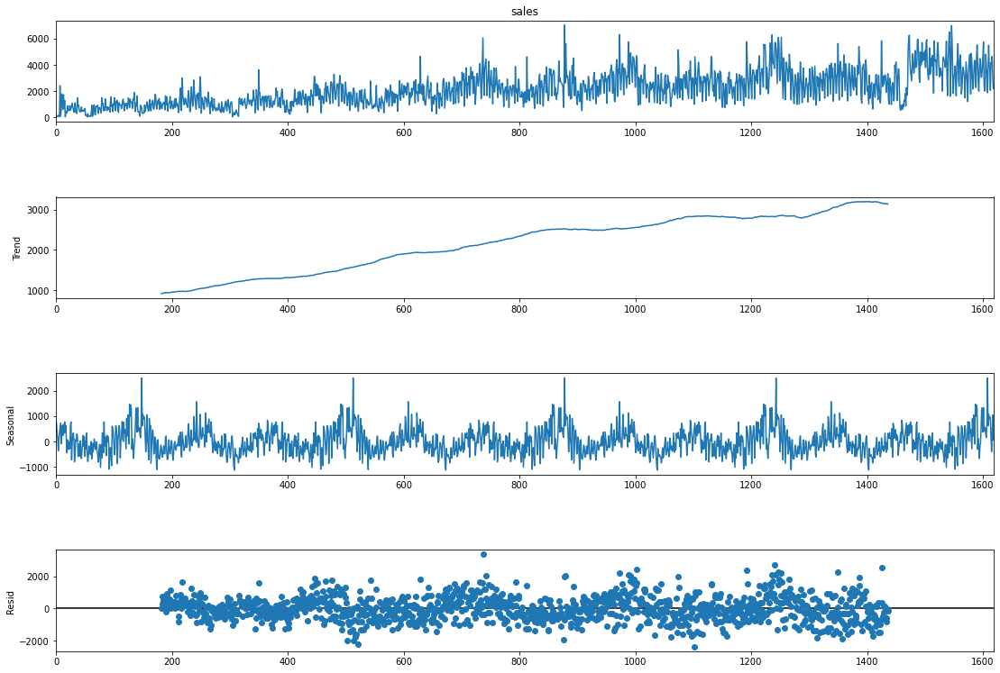

In [125]:
fig = seas_d.plot()
fig.set_figwidth(18)
fig.set_figheight(12)
plt.show()

Comprobamos la estacionalidad de los valores de ventas en el periodo mensual.

In [126]:
seas_d = sm.tsa.seasonal_decompose(y[y.date >= '2020-01-01']['sales'], model='add', period=30)

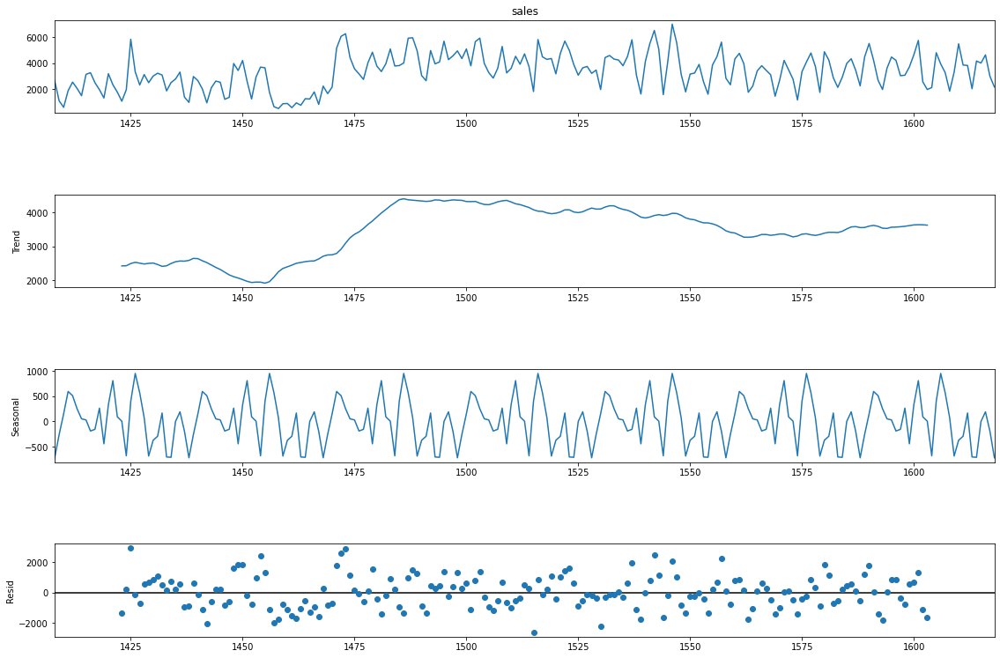

In [127]:
fig = seas_d.plot()
fig.set_figwidth(18)
fig.set_figheight(12)
plt.show()

Comprobamos la estacionalidad de los valores de ventas en el periodo semanal.

In [128]:
seas_d = sm.tsa.seasonal_decompose(y[y.date >= '2020-01-01']['sales'], model='add', period=7)

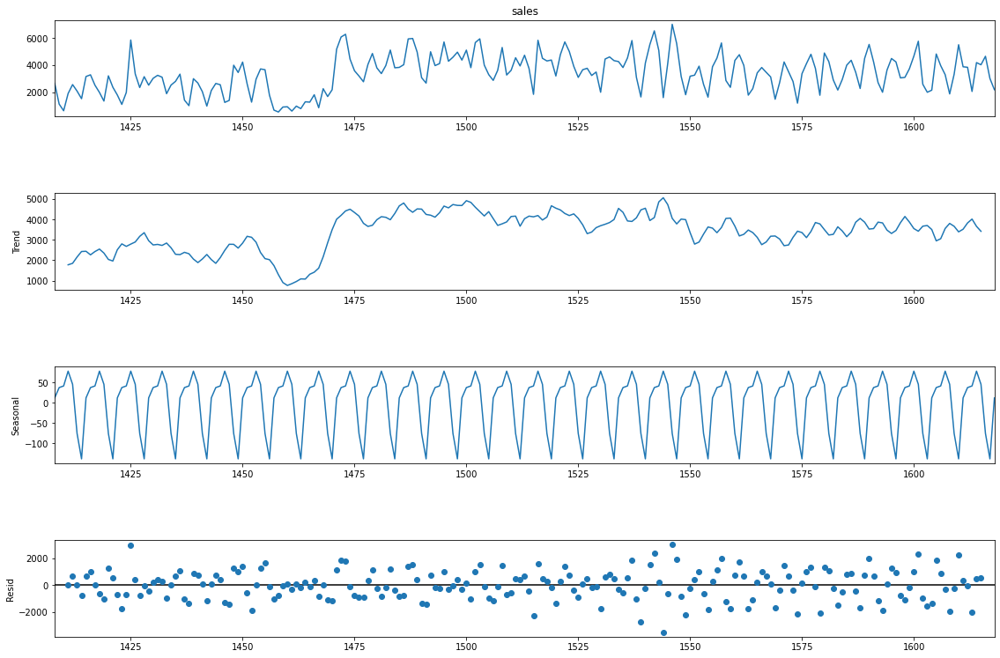

In [129]:
fig = seas_d.plot()
fig.set_figwidth(18)
fig.set_figheight(12)
plt.show()

Se verifica que, al menos gráficamente, se observa una clara estacionalidad en los datos de ventas en los periodos anual, mensual y semanal.

Si hacemos que los datos sean estacionarios, entonces el modelo puede hacer predicciones basadas en el hecho de que la media y la varianza seguirán siendo las mismas en el futuro. Una serie estacionaria es más fácil de predecir. Para comprobar si los datos son estacionarios, usaremos la prueba <strong>Augmented Dickey-Fuller (ADF)</strong>. Es el método estadístico más popular para encontrar si la serie es estacionaria o no. También se denomina prueba de raíz unitaria.

In [130]:
!pip install stattools

from statsmodels.tsa.stattools import adfuller

In [131]:
def test_adf(series, title=''):
    dfout={}
    dftest=sm.tsa.adfuller(series.dropna(), autolag='AIC', regression='ct')
    
    for key, val in dftest[4].items():
        dfout[f'critical value ({key})'] = val
    
    if dftest[1] <= 0.05:
        print('Strong evidence against Null Hypothesis')
        print('Reject Null Hypothesis - Data is Stationary')
        print('Data is Stationary for', title)
    else:
        print('Strong evidence for Null Hypothesis')
        print('Accept Null Hypothesis - Data is not Stationary')
        print('Data is NOT Stationary for', title)

Comprobamos que los datos de ventas del conjunto de entrenamiento (del 01/01/2016 al 31/12/2019) son estacionarios.

In [132]:
test_adf(train_sales_vals, 'Train Sales')

Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary for Train Sales


Comprobamos que los datos de ventas del conjunto de test (del 01/01/2020 en adelante) no son estacionarios.

In [133]:
test_adf(test_sales_vals, 'Test Sales')

Strong evidence for Null Hypothesis
Accept Null Hypothesis - Data is not Stationary
Data is NOT Stationary for Test Sales


Comprobamos que los datos de ventas del conjunto de test (del 01/01/2020 en adelante) pasan a ser estacionarios aplicando la <strong>transformación logarítmica</strong>.

In [134]:
!pip install numpy

import numpy as np

In [135]:
test_adf(np.log10(test_sales_vals), 'Log10 Test Sales')

Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary for Log10 Test Sales


Según esto, aplicamos la transformación logarítmica a todos los dataset para estabilizar la varianza en los datos y hacerla estacionaria antes de alimentarla al modelo.

In [136]:
train_sales_log = np.log10(train_sales_vals)

In [137]:
test_sales_log = np.log10(test_sales_vals)

In [138]:
train_exog_log = np.log10(train_exog_vals)

<ipython-input-138-0119a2c6863b>:1: RuntimeWarning: divide by zero encountered in log10
  train_exog_log = np.log10(train_exog_vals)


In [139]:
test_exog_log = np.log10(test_exog_vals)

<ipython-input-139-6fc4c1a72dd6>:1: RuntimeWarning: divide by zero encountered in log10
  test_exog_log = np.log10(test_exog_vals)


In [140]:
from numpy import inf

In [141]:
train_exog_log[train_exog_log.negative_words == -inf] = 0

In [142]:
test_exog_log[test_exog_log.negative_words == -inf] = 0

Aplicamos ARIMA y SARIMAX a nuestros datos y veamos cuál funciona mejor. Tanto para ARIMA como para SARIMA o SARIMAX, necesitamos conocer los términos AR y MA para corregir cualquier autocorrelación en la serie diferenciada.

Observamos los gráficos de función de autocorrelación (ACF) y de autocorrelación parcial (PACF) de la serie diferenciada.

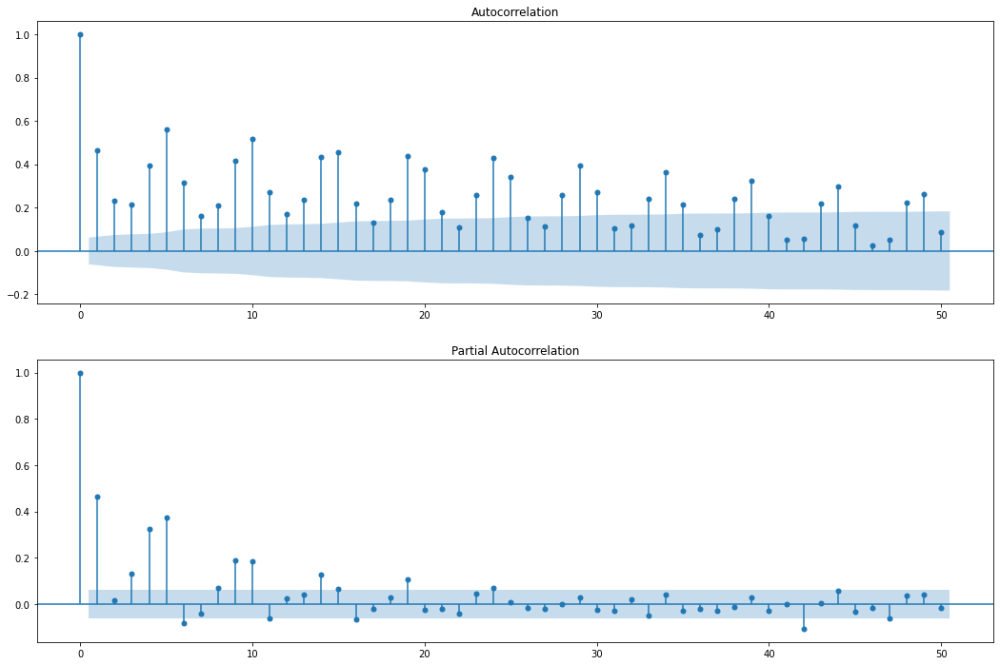

In [143]:
fig, ax = plt.subplots(2, 1, figsize=(18, 12))
fig=sm.tsa.graphics.plot_acf(train_sales_log, lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(train_sales_log, lags=50, ax=ax[1])
plt.show()

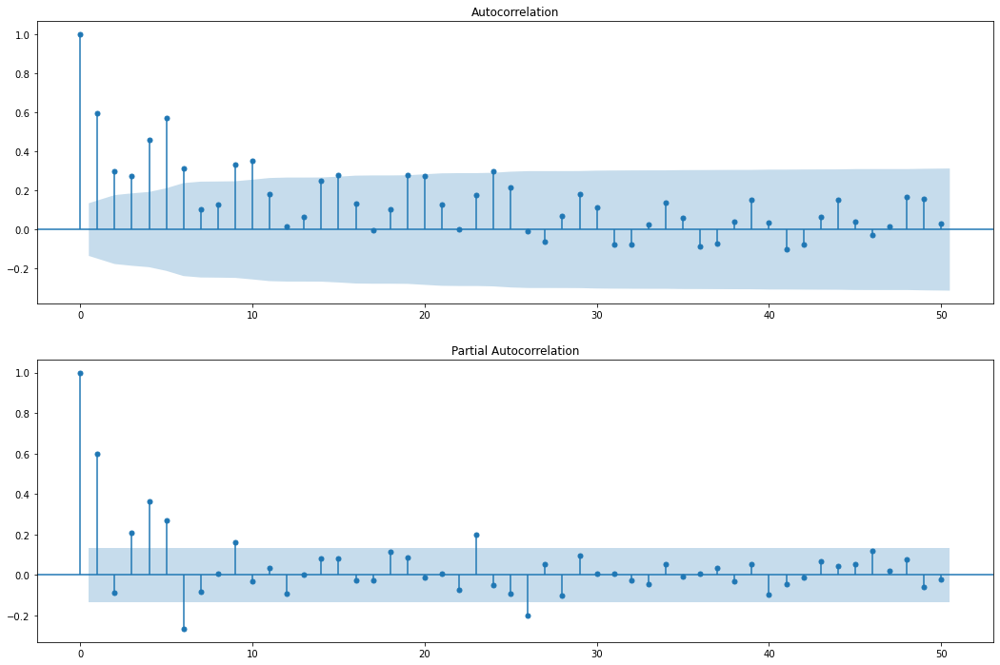

In [144]:
fig, ax = plt.subplots(2, 1, figsize=(18, 12))
fig=sm.tsa.graphics.plot_acf(test_sales_log, lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(test_sales_log, lags=50, ax=ax[1])
plt.show()

Vemos que el gráfico PACF tiene un pico significativo en el lag 1 y el lag 2, lo que significa que todas las autocorrelaciones de orden superior se explican de manera efectiva por las autocorrelaciones de lag 1 y lag 2.

Usamos pyramid auto Arima para realizar una búsqueda paso a paso del término AR y MA que dé el valor más bajo de AIC.

In [145]:
!pip install pmdarima

from pmdarima.arima import auto_arima

In [146]:
stepwise_model = auto_arima(
    train_sales_log,
    exogenous=train_exog_log,
    start_p=0, start_q=0,
    start_P=0, start_Q=0,
    max_p=7, max_q=7,
    d=1, D=1,
    m=7,
    seasonal=True,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=712.766, Time=0.68 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=24.234, Time=6.39 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=12.64 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=695.554, Time=0.29 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=-53.530, Time=8.63 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=inf, Time=35.54 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=10.60 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=100.893, Time=4.37 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=-139.083, Time=8.92 sec
 ARIMA(2,1,0)(1,1,0)[7]             : AIC=-65.209, Time=7.87 sec
 ARIMA(2,1,0)(2,1,1)[7]             : AIC=inf, Time=23.90 sec
 ARIMA(2,1,0)(1,1,1)[7]             : AIC=inf, Time=11.74 sec
 ARIMA(3,1,0)(2,1,0)[7]             : AIC=-233.516, Time=13.81 sec
 ARIMA(3,1,0)(1,1,0)[7]             : AIC=-164.932, Time=6.61 sec
 ARIMA(3,1,0)(2,1,1)[7]             : AIC=inf, Time=36.35 s

In [147]:
stepwise_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                 1006
Model:             SARIMAX(4, 1, 0)x(2, 1, 0, 7)   Log Likelihood                 229.556
Date:                           Sun, 13 Dec 2020   AIC                           -437.111
Time:                                   14:38:07   BIC                           -383.148
Sample:                                        0   HQIC                          -416.600
                                          - 1006                                         
Covariance Type:                             opg                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
stock_volume                     0   2.45e-10          0      1.000   -4.79e-10    4.79e-10
stock_mean                       0   2.45e-10          0      1.000   -4.79e-10    4.79e-10
negative_words                   0   2.45e-10          0      1.000   -4.79e-10    4.79e-10
negative_economic_words          0   2.45e-10          0      1.000   -4.79e-10    4.79e-10
ar.L1                      -0.6904      0.029    -24.118      0.000      -0.746      -0.634
ar.L2                      -0.6693      0.032    -20.607      0.000      -0.733      -0.606
ar.L3                      -0.6099      0.032    -19.327      0.000      -0.672      -0.548
ar.L4                      -0.4387      0.027    -16.336      0.000      -0.491      -0.386
ar.S.L7                    -0.7461      0.033    -22.728      0.000      -0.810      -0.682
ar.S.L14                   -0.3087      0.032     -9.652      0.000      -0.371      -0.246
sigma2                      0.0367      0.001     26.575      0.000       0.034       0.039
===================================================================================
Ljung-Box (Q):                      255.43   Jarque-Bera (JB):                48.22
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.32
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number  1e+25. Standard errors may be unstable.
"""

El modelo sugerido por auto_arima es SARIMAX, y los valores de p, d, q y de P, D, Q son 4, 1, 0 y 2, 1, 0, respectivamente.

En este punto, se procede a predecir el siguiente punto de datos y se recorren los datos de entrenamiento para predecir los siguientes datos y agregar el siguiente punto de datos después de la predicción para un pronóstico adicional. Esto es como una ventana móvil de datos de nivel diario.

In [148]:
import warnings

warnings.filterwarnings('ignore')

In [149]:
predictions = list()
predict_log = list()

In [150]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    for t in range(len(test_sales_log)):
        stepwise_model.fit(train_sales_log)
        output = stepwise_model.predict(n_periods=1)
        predict_log.append(output[0])
        yhat = 10**output[0]
        predictions.append(yhat)
        obs = test_sales_log.iloc[t]
        train_sales_log = train_sales_log.append(pd.Series(obs), ignore_index=True)
        print('t=%f, predicted=%f, expected=%f' % (t, output[0], obs))
        obs = test_exog_log.iloc[t]
        train_exog_log = train_exog_log.append(pd.Series(obs), ignore_index=True)

t=0.000000, predicted=3.368172, expected=3.423143
t=1.000000, predicted=3.461359, expected=3.049001
t=2.000000, predicted=2.985679, expected=2.799520
t=3.000000, predicted=3.116047, expected=3.278824
t=4.000000, predicted=3.167223, expected=3.407829
t=5.000000, predicted=3.379033, expected=3.317735
t=6.000000, predicted=3.077627, expected=3.181441
t=7.000000, predicted=3.175749, expected=3.498612
t=8.000000, predicted=3.232257, expected=3.515478
t=9.000000, predicted=3.083233, expected=3.399909
t=10.000000, predicted=3.438482, expected=3.296928
t=11.000000, predicted=3.256537, expected=3.128105
t=12.000000, predicted=3.417989, expected=3.505314
t=13.000000, predicted=3.498939, expected=3.373118
t=14.000000, predicted=3.576282, expected=3.252892
t=15.000000, predicted=3.065562, expected=3.040337
t=16.000000, predicted=2.870999, expected=3.296095
t=17.000000, predicted=3.479972, expected=3.766420
t=18.000000, predicted=3.375537, expected=3.523754
t=19.000000, predicted=3.381520, expected

<h2>Resultados</h2>
<h3>Visualización de gráfica de resultados</h3>

Se procede a utilizar el error cuadrático medio (RMSE) para evaluar el modelo.

In [151]:
!pip install python-math
!pip install scikit-metrics

import math
from sklearn.metrics import mean_squared_error

In [152]:
error = math.sqrt(mean_squared_error(test_sales_log, predict_log[0:211:]))
print('Test RMSE: %.3f' % error)

Test RMSE: 0.183


A continuación, para visualizar, creemos un marco de datos con los datos reales disponibles y los resultados de la predicción.

In [153]:
predicted_df = pd.DataFrame()
predicted_df['date'] = daily_sales_df['date'][(daily_sales_df.date >= test_date_from) & (daily_sales_df.date <= test_date_to)]
predicted_df['sales'] = test_sales_vals.values
predicted_df['predicted'] = predictions

In [154]:
predicted_df

,date,sales,predicted
1408,2020-01-02,2649.37,2334.382674
1409,2020-01-03,1119.44,2893.071277
1410,2020-01-06,630.26,967.562670
1411,2020-01-07,1900.31,1306.310775
1412,2020-01-08,2557.58,1469.679874
...,...,...,...
1614,2020-10-26,4176.29,3021.521957
1615,2020-10-27,4016.97,4988.935027
1616,2020-10-28,4641.49,3492.674017
1617,2020-10-29,3006.00,3457.905500


Dibujamos la gráfica de las predicciones en relación a las ventas reales.

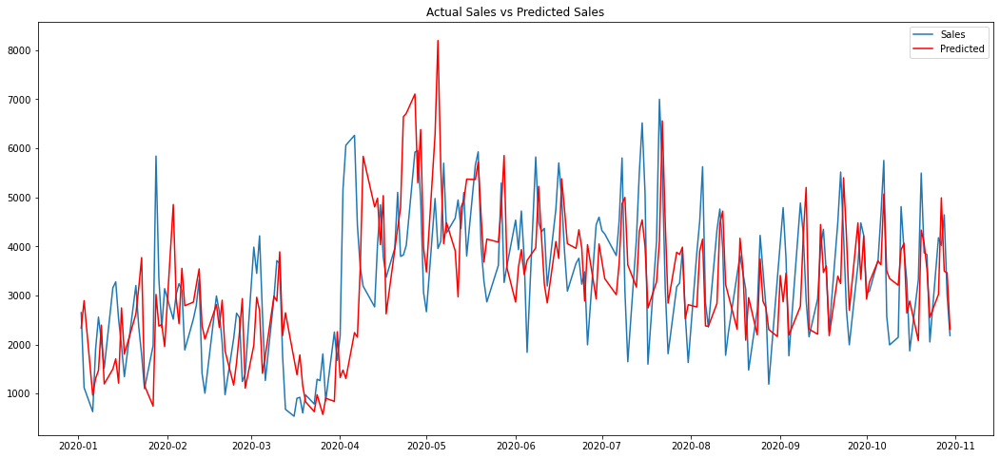

In [155]:
figsize=(18, 8)
plt.figure(figsize=figsize)
plt.title('Actual Sales vs Predicted Sales')
plt.plot(predicted_df.date, predicted_df.sales, label='Sales')
plt.plot(predicted_df.date, predicted_df.predicted, color='red', label='Predicted')
plt.legend(loc='upper right')
plt.show()

Comprobamos que la predicción reproduce con bastante fidelidad el pico de caídas en las ventas de mediados de marzo, así como el repunte en ventas del mes siguiente.

<h3>Detección y visualización de anomalías</h3>

Una vez con los resultados de pronóstico y datos reales, procedemos a detectar anomalías. Para ello, se siguen los siguientes pasos:

1. Cálculo del término de error (real-predicción).
2. Cálculo de la media móvil y la desviación estándar móvil (la ventana es una semana).
3. Clasificación de los datos con un error de 1.5, 1.75 y 2 desviaciones estándar como límites para anomalías bajas, medias y altas (el 5% de los puntos de datos serían anomalías identificadas según esta propiedad).

In [156]:
def detect_classify_anomalies(df, window):
    df = df.copy()
    df.replace([np.inf, -np.inf], np.NaN, inplace=True)
    df.fillna(0, inplace=True)
    df['error'] = df['sales'] - df['predicted']
    df['percentage_change'] = ((df['error']) / df['sales']) * 100
    df['meanval'] = df['error'].rolling(window=window).mean()
    df['deviation'] = df['error'].rolling(window=window).std()
    df['-3s'] = df['meanval'] - (2 * df['deviation'])
    df['3s'] = df['meanval'] + (2 * df['deviation'])
    df['-2s'] = df['meanval'] - (1.75 * df['deviation'])
    df['2s'] = df['meanval'] + (1.75 * df['deviation'])
    df['-1s'] = df['meanval'] - (1.5 * df['deviation'])
    df['1s'] = df['meanval'] + (1.5 * df['deviation'])
    cut_list = df[['error', '-3s', '-2s', '-1s', 'meanval', '1s', '2s', '3s']]
    cut_values = cut_list.values
    cut_sort = np.sort(cut_values)
    df['impact'] = [(lambda x: np.where(cut_sort == df['error'].iloc[x])[1][0])(x) for x in range(len(df['error']))]
    severity = {0:3, 1:2, 2:1, 3:0, 4:0, 5:1, 6:2, 7:3}
    region = {0:'NEGATIVE', 1:'NEGATIVE', 2:'NEGATIVE', 3:'NEGATIVE', 4:'POSITIVE', 5:'POSITIVE', 6:'POSITIVE', 7:'POSITIVE'}
    df['color'] = df['impact'].map(severity)
    df['region'] = df['impact'].map(region)
    df['anomaly_points_level_1'] = np.where(df['color'] == 1, df['error'], np.nan)
    df['anomaly_points_level_2'] = np.where(df['color'] == 2, df['error'], np.nan)
    df['anomaly_points_level_3'] = np.where(df['color'] == 3, df['error'], np.nan)
    df = df.sort_values(by='date', ascending=False)
    df.date = pd.to_datetime(df['date'].astype(str), format='%Y-%m-%d')
    
    return df

In [157]:
classify_df = detect_classify_anomalies(predicted_df, 7)

In [158]:
classify_df.reset_index(inplace=True)

In [159]:
classify_df = classify_df.drop("index", axis=1)

In [160]:
classify_df.date = classify_df.date.dt.strftime('%Y-%m-%d')

In [161]:
classify_df

,date,sales,predicted,error,percentage_change,meanval,deviation,-3s,3s,-2s,2s,-1s,1s,impact,color,region,anomaly_points_level_1,anomaly_points_level_2,anomaly_points_level_3
0,2020-10-30,2181.25,2311.161204,-129.911204,-5.955815,78.086650,828.394709,-1578.702769,1734.876068,-1371.604092,1527.777391,-1164.505414,1320.678714,3,0,NEGATIVE,NaN,NaN,NaN
1,2020-10-29,3006.00,3457.905500,-451.905500,-15.033450,68.751556,831.491664,-1594.231772,1731.734885,-1386.358856,1523.861969,-1178.485940,1315.989052,3,0,NEGATIVE,NaN,NaN,NaN
2,2020-10-28,4641.49,3492.674017,1148.815983,24.751017,299.308888,885.086889,-1470.864889,2069.482666,-1249.593167,1848.210944,-1028.321445,1626.939222,4,0,POSITIVE,NaN,NaN,NaN
3,2020-10-27,4016.97,4988.935027,-971.965027,-24.196472,312.225894,900.083672,-1487.941449,2112.393238,-1262.920531,1887.372320,-1037.899613,1662.351402,3,0,NEGATIVE,NaN,NaN,NaN
4,2020-10-26,4176.29,3021.521957,1154.768043,27.650571,306.178526,910.234706,-1514.290885,2126.647937,-1286.732208,1899.089261,-1059.173532,1671.530585,4,0,POSITIVE,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,2020-01-08,2557.58,1469.679874,1087.900126,42.536309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,NEGATIVE,NaN,NaN,1087.900126
207,2020-01-07,1900.31,1306.310775,593.999225,31.258017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,NEGATIVE,NaN,NaN,593.999225
208,2020-01-06,630.26,967.562670,-337.302670,-53.518020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,NEGATIVE,NaN,NaN,-337.302670
209,2020-01-03,1119.44,2893.071277,-1773.631277,-158.439155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,NEGATIVE,NaN,NaN,-1773.631277


A continuación, se muestra una función para visualizar los resultados. Una vez más, la importancia de una visualización clara e integral ayuda a los usuarios comerciales a dar comentarios sobre las anomalías y hace que los resultados sean procesables.

El primer gráfico tiene el término de error con el límite superior e inferior especificado, con las anomalías resaltadas sería fácil de interpretar/validar para un usuario. El segundo gráfico tiene valores reales y pronosticados con anomalías resaltadas.

In [162]:
!pip install plotly

import plotly.graph_objects as go
from plotly.offline import iplot

In [163]:
def plot_anomaly(df, metric_name):
    dates = df.date
    
    bool_array_level_1 = (abs(df['anomaly_points_level_1']) > 0)
    sales_level_1 = df["sales"][-len(bool_array_level_1):]
    anomaly_points_level_1 = bool_array_level_1 * sales_level_1
    anomaly_points_level_1[anomaly_points_level_1 == 0] = np.nan
    
    bool_array_level_2 = (abs(df['anomaly_points_level_2']) > 0)
    sales_level_2 = df["sales"][-len(bool_array_level_2):]
    anomaly_points_level_2 = bool_array_level_2 * sales_level_2
    anomaly_points_level_2[anomaly_points_level_2 == 0] = np.nan
    
    bool_array_level_3 = (abs(df['anomaly_points_level_3']) > 0)
    sales_level_3 = df["sales"][-len(bool_array_level_3):]
    anomaly_points_level_3 = bool_array_level_3 * sales_level_3
    anomaly_points_level_3[anomaly_points_level_3 == 0] = np.nan
    
    color_map = {0:'rgba(228, 222, 249, 0.65)', 1:'yellow', 2:'orange', 3:'red'}
    
    table = go.Table(
        domain = dict(x=[0, 1],
                      y=[0, 0.3]),
        columnwidth = [1, 2],
        header = dict(height=20,
                      values=[['<b>Date</b>'], ['<b>Sales</b>'],
                              ['<b>Predicted</b>'], ['<b>% Difference</b>'], ['<b>Severity (0-3)</b>']],
                      font=dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                      fill=dict(color='#d562be')),
        cells = dict(values=[df.round(2)[k].tolist() for k in ['date', 'sales', 'predicted',
                                                               'percentage_change', 'color']],
                     line=dict(color='#506784'),
                     align=['center'] * 5,
                     font=dict(color=['rgb(40, 40, 40)'] * 5, size=12),
                     suffix=[None] + [''] + [''] + ['%'] + [''],
                     height=27,
                     fill=dict(color=[df['color'].map(color_map)])))
    
    error = go.Scatter(name='Error',
                       x=dates,
                       y=df['error'],
                       xaxis='x1',
                       yaxis='y1',
                       mode='lines',
                       marker=dict(size=12,
                                   line=dict(width=1),
                                   color='darkred'),
                       text='Error')
    
    mvingavrg = go.Scatter(name='Moving Average',
                           x=dates,
                           y=df['meanval'],
                           mode='lines',
                           xaxis='x1',
                           yaxis='y1',
                           marker=dict(size=12,
                                       line=dict(width=1),
                                       color='green'),
                           text='Moving average')
    
    anomalies_level_1 = go.Scatter(name='Anomaly Level 1',
                           x=dates,
                           xaxis='x1',
                           yaxis='y1',
                           y=df['anomaly_points_level_1'],
                           mode='markers',
                           marker=dict(color='yellow',
                                       size=11,
                                       line=dict(color='yellow',
                                                 width=1)))
    
    anomalies_level_2 = go.Scatter(name='Anomaly Level 2',
                           x=dates,
                           xaxis='x1',
                           yaxis='y1',
                           y=df['anomaly_points_level_2'],
                           mode='markers',
                           marker=dict(color='orange',
                                       size=11,
                                       line=dict(color='orange',
                                                 width=1)))
    
    anomalies_level_3 = go.Scatter(name='Anomaly Level 3',
                           x=dates,
                           xaxis='x1',
                           yaxis='y1',
                           y=df['anomaly_points_level_3'],
                           mode='markers',
                           marker=dict(color='red',
                                       size=11,
                                       line=dict(color='red',
                                                 width=1)))
    
    upper_bound = go.Scatter(name='Upper Confidence Interval',
                             x=dates,
                             showlegend=False,
                             xaxis='x1',
                             yaxis='y1',
                             y=df['3s'],
                             marker=dict(color='#444'),
                             line=dict(color=('rgb(23, 96, 167)'),
                                       width=2,
                                       dash='dash'),
                             fillcolor='rgba(68, 68, 68, 0.3)',
                             fill='tonexty')
    
    lower_bound = go.Scatter(name='Confidence Interval',
                             x=dates,
                             xaxis='x1',
                             yaxis='y1',
                             y=df['-3s'],
                             marker=dict(color='#444'),
                             line=dict(color=('rgb(23, 96, 167)'),
                                       width=2,
                                       dash='dash'),
                             fillcolor='rgba(68, 68, 68, 0.3)',
                             fill='tonexty')
    
    sales = go.Scatter(name='Sales',
                       x=dates,
                       y=df['sales'],
                       xaxis='x2',
                       yaxis='y2',
                       mode='lines',
                       marker=dict(size=12,
                                   line=dict(width=1),
                                   color='blue'))
    
    predicted = go.Scatter(name='Predicted',
                           x=dates,
                           y=df['predicted'],
                           xaxis='x2',
                           yaxis='y2',
                           mode='lines',
                           marker=dict(size=12,
                                       line=dict(width=1),
                                       color='silver'))
    
    anomalies_map_level_1 = go.Scatter(name='Anomaly Sales Level 1',
                               showlegend=False,
                               x=dates,
                               y=anomaly_points_level_1,
                               mode='markers',
                               xaxis='x2',
                               yaxis='y2',
                               marker=dict(color='yellow',
                                           size=11,
                                           line=dict(color='yellow',
                                                     width=1)))
    
    anomalies_map_level_2 = go.Scatter(name='Anomaly Sales Level 2',
                               showlegend=False,
                               x=dates,
                               y=anomaly_points_level_2,
                               mode='markers',
                               xaxis='x2',
                               yaxis='y2',
                               marker=dict(color='orange',
                                           size=11,
                                           line=dict(color='orange',
                                                     width=1)))
    
    anomalies_map_level_3 = go.Scatter(name='Anomaly Sales Level 3',
                               showlegend=False,
                               x=dates,
                               y=anomaly_points_level_3,
                               mode='markers',
                               xaxis='x2',
                               yaxis='y2',
                               marker=dict(color='red',
                                           size=11,
                                           line=dict(color='red',
                                                     width=1)))
    
    axis = dict(showline=True,
                zeroline=False,
                showgrid=True,
                mirror=True,
                ticklen=4,
                gridcolor='#ffffff',
                tickfont=dict(size=10))
    
    layout = dict(width=950,
                  height=950,
                  autosize=False,
                  title=metric_name,
                  margin=dict(l=0, r=0, t=50, b=10),
                  showlegend=True,
                  legend=dict(font=dict(size=10)),
                  xaxis1=dict(axis,
                              **dict(domain=[0, 1],
                                     anchor='y1',
                                     showticklabels=True)),
                  xaxis2=dict(axis,
                              **dict(domain=[0, 1],
                                     anchor='y2',
                                     showticklabels=True)),
                  yaxis1=dict(axis,
                              **dict(domain=[0.70, 1],
                                     anchor='x1',
                                     hoverformat='.2f')),
                  yaxis2=dict(axis,
                              **dict(domain=[0.34, 0.64],
                                     anchor='x2',
                                     hoverformat='.2f')))
    
    fig = go.Figure(data=[table, upper_bound, lower_bound, sales,
                          predicted, mvingavrg, error,
                          anomalies_level_1, anomalies_level_2, anomalies_level_3,
                          anomalies_map_level_1, anomalies_map_level_2, anomalies_map_level_3],
                    layout=layout)
    
    return iplot(fig)

In [164]:
plot_anomaly(classify_df, "Daily Sales Anomaly Detection")

Al utilizar una media móvil y una desviación estándar aquí, se evitan falsas anomalías continuas durante escenarios como los días de grandes ventas. Se resalta el primer pico o caída, después de lo cual se ajustan los umbrales. Además, la tabla que proporciona datos reales predijo el cambio y el formato condicional en función del nivel de anomalías.

Por último, se propone una alternativa para detectar anomalías, en este caso por distintos niveles de porcentaje de error entre los valores reales y los predichos.

In [165]:
def detect_classify_anomalies_percentages(df, window):
    df = df.copy()
    df.replace([np.inf, -np.inf], np.NaN, inplace=True)
    df.fillna(0, inplace=True)
    df['error'] = abs(df['sales'] - df['predicted'])
    df['percentage_change'] = ((df['error']) / df['sales']) * 100
    df['25p_error'] = (df['sales'] * 0.25)
    df['50p_error'] = (df['sales'] * 0.5)
    df['75p_error'] = (df['sales'] * 0.75)
    df['100p_error'] = (df['sales'] * 1)
    cut_list = df[['error', '25p_error', '50p_error', '75p_error', '100p_error']]
    cut_values = cut_list.values
    cut_sort = np.sort(cut_values)
    df['impact'] = [(lambda x: np.where(cut_sort == df['error'].iloc[x])[1][0])(x) for x in range(len(df['error']))]
    severity = {0:0, 1:1, 2:2, 3:3, 4:4}
    df['color'] = df['impact'].map(severity)
    df['anomaly_points_level_1'] = np.where(df['color'] == 1, df['error'], np.nan)
    df['anomaly_points_level_2'] = np.where(df['color'] == 2, df['error'], np.nan)
    df['anomaly_points_level_3'] = np.where(df['color'] == 3, df['error'], np.nan)
    df['anomaly_points_level_4'] = np.where(df['color'] == 4, df['error'], np.nan)
    df = df.sort_values(by='date', ascending=False)
    df.date = pd.to_datetime(df['date'].astype(str), format='%Y-%m-%d')
    
    return df

In [166]:
classify_df = detect_classify_anomalies_percentages(predicted_df, 7)

In [167]:
classify_df.reset_index(inplace=True)

In [168]:
classify_df = classify_df.drop("index", axis=1)

In [169]:
classify_df.date = classify_df.date.dt.strftime('%Y-%m-%d')

In [170]:
classify_df

,date,sales,predicted,error,percentage_change,25p_error,50p_error,75p_error,100p_error,impact,color,anomaly_points_level_1,anomaly_points_level_2,anomaly_points_level_3,anomaly_points_level_4
0,2020-10-30,2181.25,2311.161204,129.911204,5.955815,545.3125,1090.625,1635.9375,2181.25,0,0,NaN,NaN,NaN,NaN
1,2020-10-29,3006.00,3457.905500,451.905500,15.033450,751.5000,1503.000,2254.5000,3006.00,0,0,NaN,NaN,NaN,NaN
2,2020-10-28,4641.49,3492.674017,1148.815983,24.751017,1160.3725,2320.745,3481.1175,4641.49,0,0,NaN,NaN,NaN,NaN
3,2020-10-27,4016.97,4988.935027,971.965027,24.196472,1004.2425,2008.485,3012.7275,4016.97,0,0,NaN,NaN,NaN,NaN
4,2020-10-26,4176.29,3021.521957,1154.768043,27.650571,1044.0725,2088.145,3132.2175,4176.29,1,1,1154.768043,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,2020-01-08,2557.58,1469.679874,1087.900126,42.536309,639.3950,1278.790,1918.1850,2557.58,1,1,1087.900126,NaN,NaN,NaN
207,2020-01-07,1900.31,1306.310775,593.999225,31.258017,475.0775,950.155,1425.2325,1900.31,1,1,593.999225,NaN,NaN,NaN
208,2020-01-06,630.26,967.562670,337.302670,53.518020,157.5650,315.130,472.6950,630.26,2,2,NaN,337.30267,NaN,NaN
209,2020-01-03,1119.44,2893.071277,1773.631277,158.439155,279.8600,559.720,839.5800,1119.44,4,4,NaN,NaN,NaN,1773.631277


In [171]:
def plot_anomaly_percentages(df, metric_name):
    dates = df.date
    
    bool_array_level_1 = (abs(df['anomaly_points_level_1']) > 0)
    sales_level_1 = df["sales"][-len(bool_array_level_1):]
    anomaly_points_level_1 = bool_array_level_1 * sales_level_1
    anomaly_points_level_1[anomaly_points_level_1 == 0] = np.nan
    
    bool_array_level_2 = (abs(df['anomaly_points_level_2']) > 0)
    sales_level_2 = df["sales"][-len(bool_array_level_2):]
    anomaly_points_level_2 = bool_array_level_2 * sales_level_2
    anomaly_points_level_2[anomaly_points_level_2 == 0] = np.nan
    
    bool_array_level_3 = (abs(df['anomaly_points_level_3']) > 0)
    sales_level_3 = df["sales"][-len(bool_array_level_3):]
    anomaly_points_level_3 = bool_array_level_3 * sales_level_3
    anomaly_points_level_3[anomaly_points_level_3 == 0] = np.nan
    
    bool_array_level_4 = (abs(df['anomaly_points_level_4']) > 0)
    sales_level_4 = df["sales"][-len(bool_array_level_4):]
    anomaly_points_level_4 = bool_array_level_4 * sales_level_4
    anomaly_points_level_4[anomaly_points_level_4 == 0] = np.nan
    
    color_map = {0:'rgba(228, 222, 249, 0.65)', 1:'yellow', 2:'orange', 3:'red', 4:'darkred'}
    
    table = go.Table(
        domain = dict(x=[0, 1],
                      y=[0, 0.45]),
        columnwidth = [1, 2],
        header = dict(height=20,
                      values=[['<b>Date</b>'], ['<b>Sales</b>'],
                              ['<b>Predicted</b>'], ['<b>% Difference</b>'], ['<b>Severity (0-3)</b>']],
                      font=dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                      fill=dict(color='#d562be')),
        cells = dict(values=[df.round(2)[k].tolist() for k in ['date', 'sales', 'predicted',
                                                               'percentage_change', 'color']],
                     line=dict(color='#506784'),
                     align=['center'] * 5,
                     font=dict(color=['rgb(40, 40, 40)'] * 5, size=12),
                     suffix=[None] + [''] + [''] + ['%'] + [''],
                     height=27,
                     fill=dict(color=[df['color'].map(color_map)])))
    
    sales = go.Scatter(name='Sales',
                       x=dates,
                       y=df['sales'],
                       xaxis='x1',
                       yaxis='y1',
                       mode='lines',
                       marker=dict(size=12,
                                   line=dict(width=1),
                                   color='blue'))
    
    predicted = go.Scatter(name='Predicted',
                           x=dates,
                           y=df['predicted'],
                           xaxis='x1',
                           yaxis='y1',
                           mode='lines',
                           marker=dict(size=12,
                                       line=dict(width=1),
                                       color='silver'))
    
    anomalies_map_level_1 = go.Scatter(name='Anomaly Sales Level 1',
                               x=dates,
                               y=anomaly_points_level_1,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color='yellow',
                                           size=11,
                                           line=dict(color='yellow',
                                                     width=1)))
    
    anomalies_map_level_2 = go.Scatter(name='Anomaly Sales Level 2',
                               x=dates,
                               y=anomaly_points_level_2,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color='orange',
                                           size=11,
                                           line=dict(color='orange',
                                                     width=1)))
    
    anomalies_map_level_3 = go.Scatter(name='Anomaly Sales Level 3',
                               x=dates,
                               y=anomaly_points_level_3,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color='red',
                                           size=11,
                                           line=dict(color='red',
                                                     width=1)))
    
    anomalies_map_level_4 = go.Scatter(name='Anomaly Sales Level 4',
                               x=dates,
                               y=anomaly_points_level_4,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color='darkred',
                                           size=11,
                                           line=dict(color='darkred',
                                                     width=1)))
    
    axis = dict(showline=True,
                zeroline=False,
                showgrid=True,
                mirror=True,
                ticklen=4,
                gridcolor='#ffffff',
                tickfont=dict(size=6))
    
    layout = dict(width=950,
                  height=950,
                  autosize=False,
                  title=metric_name,
                  margin=dict(l=0, r=0, t=50, b=10),
                  showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="left",
                              x=0.01,
                              font=dict(size=10)),
                  xaxis1=dict(axis,
                              **dict(domain=[0, 1],
                                     anchor='y1',
                                     showticklabels=True)),
                  yaxis1=dict(axis,
                              **dict(domain=[0.5, 1],
                                     anchor='x1',
                                     hoverformat='.2f')))
    
    fig = go.Figure(data=[table, sales, predicted,
                          anomalies_map_level_1, anomalies_map_level_2, anomalies_map_level_3, anomalies_map_level_4],
                    layout=layout)
    
    return iplot(fig)

In [172]:
plot_anomaly_percentages(classify_df, "Daily Sales Anomaly Detection (by percentages)")